### Geo data analysis

TO DO:
- Explaratory analysis (average prices, availability, cnts by districts. west vs east)
- Spacial exploratory analysis (clusters analysis? -> read about this)
- Map: AirBnb + POIs
- Model: Modelling location/ price


In [1]:
#Libraries
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import pandas as pd
import folium


#### Airbnb Data

Description of the AirBnb related data:
https://docs.google.com/spreadsheets/d/1iWCNJcSutYqpULSQHlNyGInUvHg2BoUGoNRIGa6Szc4/edit#gid=1938308660

In [2]:
#Import all datasets

listings_raw_short = pd.read_csv("../data - AirBnb/listings.csv")
listings_raw = pd.read_csv("../data - AirBnb/listings.csv.gz", compression='gzip', error_bad_lines=False)

calendar_raw = pd.read_csv("../data - AirBnb/calendar.csv.gz")

reviews_raw_short = pd.read_csv("../data - AirBnb/reviews.csv")
reviews_raw = pd.read_csv("../data - AirBnb/reviews.csv.gz", compression='gzip', error_bad_lines=False)

/var/folders/b1/_7msyyfn327_xyf927r6lmwc0000gn/T/ipykernel_2909/2801273649.py:4: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  listings_raw = pd.read_csv("../data - AirBnb/listings.csv.gz", compression='gzip', error_bad_lines=False)
/var/folders/b1/_7msyyfn327_xyf927r6lmwc0000gn/T/ipykernel_2909/2801273649.py:9: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  reviews_raw = pd.read_csv("../data - AirBnb/reviews.csv.gz", compression='gzip', error_bad_lines=False)


##### Data Cleaning

In [3]:
#Lets create a listings datasets that we will work with

listings = listings_raw [['id', 'listing_url', 'name',
       'host_id', 'host_since', 'host_acceptance_rate', 'host_is_superhost', 'calculated_host_listings_count',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude', 'longitude', 
       'property_type', 'room_type', 'accommodates', 'price',
       'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm', 
       'has_availability',  'availability_365', 
       'number_of_reviews', 'number_of_reviews_ltm', 'last_review', 'reviews_per_month']]

listings.columns = ['id', 'listing_url', 'name',
       'host_id', 'host_since', 'host_acceptance_rate', 'host_is_superhost', 'calculated_host_listings_count',
       'neighbourhood', 'neighbourhood_group', 'latitude', 'longitude', 
       'property_type', 'room_type', 'accommodates', 'price',
       'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm', 
       'has_availability',  'availability_365', 
       'number_of_reviews', 'number_of_reviews_ltm', 'last_review', 'reviews_per_month']

pd.set_option('display.max_columns', None)
listings.head()


,id,listing_url,name,host_id,host_since,host_acceptance_rate,host_is_superhost,calculated_host_listings_count,neighbourhood,neighbourhood_group,latitude,longitude,property_type,room_type,accommodates,price,minimum_nights_avg_ntm,maximum_nights_avg_ntm,has_availability,availability_365,number_of_reviews,number_of_reviews_ltm,last_review,reviews_per_month
0,3176,https://www.airbnb.com/rooms/3176,Rental unit in Berlin · ★4.63 · 1 bedroom · 2 ...,3718,2008-10-19,17%,f,1,Prenzlauer Berg Südwest,Pankow,52.53471,13.41810,Entire rental unit,Entire home/apt,4,$83.00,63.0,184.0,t,15,148,1,2023-05-25,0.84
1,9991,https://www.airbnb.com/rooms/9991,Rental unit in Berlin · ★5.0 · 4 bedrooms · 7 ...,33852,2009-08-25,NaN,f,1,Prenzlauer Berg Südwest,Pankow,52.53269,13.41805,Entire rental unit,Entire home/apt,7,$180.00,6.0,14.0,t,47,7,0,2020-01-04,0.07
2,183988,https://www.airbnb.com/rooms/183988,Rental unit in Berlin · ★4.69 · 1 bedroom · 2 ...,882801,2011-07-28,99%,f,1,Neue Kantstraße,Charlottenburg-Wilm.,52.50001,13.30349,Entire rental unit,Entire home/apt,4,$116.00,2.0,365.0,t,336,570,50,2023-11-26,3.92
3,14325,https://www.airbnb.com/rooms/14325,Rental unit in Berlin · ★4.68 · Studio · 1 bed...,55531,2009-11-18,47%,f,4,Prenzlauer Berg Nordwest,Pankow,52.54813,13.40366,Entire rental unit,Entire home/apt,1,$70.00,150.0,1125.0,t,107,26,1,2023-11-30,0.16
4,186663,https://www.airbnb.com/rooms/186663,Rental unit in Berlin · ★4.40 · 1 bedroom · 2 ...,897302,2011-07-31,100%,f,4,Zehlendorf Nord,Steglitz - Zehlendorf,52.43430,13.23037,Entire rental unit,Entire home/apt,2,$100.00,183.0,730.0,t,364,15,0,2016-05-16,0.11


In [136]:
listings.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9370 entries, 0 to 13326
Data columns (total 25 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   id                              9370 non-null   int64   
 1   listing_url                     9370 non-null   object  
 2   name                            9370 non-null   object  
 3   host_id                         9370 non-null   int64   
 4   host_since                      9370 non-null   object  
 5   host_acceptance_rate            8332 non-null   float64 
 6   host_is_superhost               9370 non-null   int64   
 7   calculated_host_listings_count  9370 non-null   int64   
 8   neighbourhood                   9370 non-null   category
 9   neighbourhood_group             9370 non-null   category
 10  latitude                        9370 non-null   float64 
 11  longitude                       9370 non-null   float64 
 12  property_type      

In [130]:
listings.isna().sum()

id                                   0
listing_url                          0
name                                 0
host_id                              0
host_since                           9
host_acceptance_rate              4306
host_is_superhost                    0
calculated_host_listings_count       0
neighbourhood                        0
neighbourhood_group                  0
latitude                             0
longitude                            0
property_type                        0
room_type                            0
accommodates                         0
price                             3953
minimum_nights_avg_ntm               1
maximum_nights_avg_ntm               1
has_availability                     0
availability_365                     0
number_of_reviews                    0
number_of_reviews_ltm                0
last_review                       3000
reviews_per_month                 3000
dtype: int64

Now we need to do some data cleaning. 
Firstly, we will convert variables to their expected datatypes.

In [91]:
listings.head()

,id,listing_url,name,host_id,host_since,host_acceptance_rate,host_is_superhost,calculated_host_listings_count,neighbourhood,neighbourhood_group,latitude,longitude,property_type,room_type,accommodates,price,minimum_nights_avg_ntm,maximum_nights_avg_ntm,has_availability,availability_365,number_of_reviews,number_of_reviews_ltm,last_review,reviews_per_month
0,3176,https://www.airbnb.com/rooms/3176,Rental unit in Berlin · ★4.63 · 1 bedroom · 2 ...,3718,2008-10-19,17.0,0,1,Prenzlauer Berg Südwest,Pankow,52.53471,13.41810,Entire rental unit,Entire home/apt,4,83.0,63.0,184.0,1,15,148,1,2023-05-25,0.84
1,9991,https://www.airbnb.com/rooms/9991,Rental unit in Berlin · ★5.0 · 4 bedrooms · 7 ...,33852,2009-08-25,NaN,0,1,Prenzlauer Berg Südwest,Pankow,52.53269,13.41805,Entire rental unit,Entire home/apt,7,180.0,6.0,14.0,1,47,7,0,2020-01-04,0.07
2,183988,https://www.airbnb.com/rooms/183988,Rental unit in Berlin · ★4.69 · 1 bedroom · 2 ...,882801,2011-07-28,99.0,0,1,Neue Kantstraße,Charlottenburg-Wilm.,52.50001,13.30349,Entire rental unit,Entire home/apt,4,116.0,2.0,365.0,1,336,570,50,2023-11-26,3.92
3,14325,https://www.airbnb.com/rooms/14325,Rental unit in Berlin · ★4.68 · Studio · 1 bed...,55531,2009-11-18,47.0,0,4,Prenzlauer Berg Nordwest,Pankow,52.54813,13.40366,Entire rental unit,Entire home/apt,1,70.0,150.0,1125.0,1,107,26,1,2023-11-30,0.16
4,186663,https://www.airbnb.com/rooms/186663,Rental unit in Berlin · ★4.40 · 1 bedroom · 2 ...,897302,2011-07-31,100.0,0,4,Zehlendorf Nord,Steglitz - Zehlendorf,52.43430,13.23037,Entire rental unit,Entire home/apt,2,100.0,183.0,730.0,1,364,15,0,2016-05-16,0.11


In [5]:
#Price
listings['price'] = listings['price'].replace('[\$,]', '', regex=True).astype(float)

#Categorical variables
listings[['neighbourhood', 'neighbourhood_group', 'property_type', 'room_type']] = listings[['neighbourhood', 'neighbourhood_group', 'property_type', 'room_type']].astype("category")

#Acceptance rate
listings['host_acceptance_rate'] = listings['host_acceptance_rate'].replace('[\%,]', '', regex=True).astype(float)

#Binary
listings['host_is_superhost'] = np.where(listings['host_is_superhost'] == 't', 1, 0)
listings['has_availability'] = np.where(listings['has_availability'] == 't', 1 , 0)

#Property type - create new column 
listings['isHotel'] = listings['property_type'].str.contains('hotel|hostel|guesthouse|breakfast', case=False, regex=True).astype(int)


/var/folders/b1/_7msyyfn327_xyf927r6lmwc0000gn/T/ipykernel_2909/3638729911.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  listings['price'] = listings['price'].replace('[\$,]', '', regex=True).astype(float)
/var/folders/b1/_7msyyfn327_xyf927r6lmwc0000gn/T/ipykernel_2909/3638729911.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  listings[['neighbourhood', 'neighbourhood_group', 'property_type', 'room_type']] = listings[['neighbourhood', 'neighbourhood_group', 'property_type', 'room_type']].astype("c

In [145]:
listings.describe()

,id,host_id,host_acceptance_rate,host_is_superhost,calculated_host_listings_count,latitude,longitude,accommodates,price,minimum_nights_avg_ntm,maximum_nights_avg_ntm,has_availability,availability_365,number_of_reviews,number_of_reviews_ltm,reviews_per_month,isHotel
count,9.370000e+03,9.370000e+03,8332.000000,9370.0,9370.000000,9370.000000,9370.000000,9370.000000,9370.000000,9369.000000,9.369000e+03,9370.0,9370.000000,9370.000000,9370.000000,7344.000000,9370.000000
mean,3.602528e+17,1.768353e+08,81.518123,0.0,12.612060,52.510244,13.399766,3.113554,118.548132,36.303629,1.605108e+06,0.0,169.349093,48.468090,12.518463,1.514551,0.070544
std,4.256267e+17,1.816139e+08,27.396006,0.0,37.244824,0.034663,0.071195,2.024009,114.727471,71.835675,5.868039e+07,0.0,131.670991,95.205171,23.559245,2.021449,0.256076
min,3.176000e+03,1.581000e+03,0.000000,0.0,1.000000,52.369040,13.107580,1.000000,9.000000,1.000000,1.000000e+00,0.0,0.000000,0.000000,0.000000,0.010000,0.000000
25%,2.552851e+07,1.309307e+07,71.000000,0.0,1.000000,52.491761,13.359091,2.000000,62.000000,2.000000,1.800000e+02,0.0,36.000000,1.000000,0.000000,0.310000,0.000000
50%,5.010420e+07,1.026819e+08,97.000000,0.0,2.000000,52.510540,13.407760,2.000000,91.000000,3.900000,3.650000e+02,0.0,167.000000,11.500000,3.000000,0.920000,0.000000
75%,8.185984e+17,3.384966e+08,100.000000,0.0,6.000000,52.532460,13.435756,4.000000,139.000000,87.500000,1.125000e+03,0.0,293.000000,52.000000,17.000000,2.110000,0.000000
max,1.049081e+18,5.510794e+08,100.000000,0.0,231.000000,52.650760,13.721390,16.000000,2500.000000,1000.000000,2.147484e+09,0.0,365.000000,2363.000000,716.000000,56.730000,1.000000


In [6]:
#Price
listings = listings[listings.price < 3000] #exclude listings with too high price & NAN price

##### Basic exploratory analysis

**What can we calculate here?**

/var/folders/b1/_7msyyfn327_xyf927r6lmwc0000gn/T/ipykernel_2909/3276254307.py:2: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(listings.price, shade=True, clip=(0, 500))


Text(0.5, 1.0, 'Berlin AirBnB Price distribution')

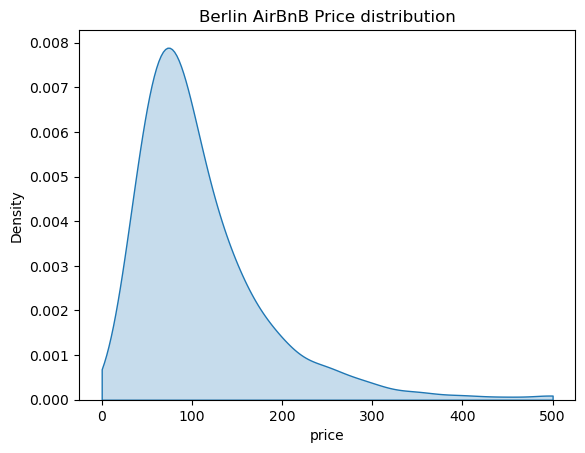

In [7]:
#Plot prices
sns.kdeplot(listings.price, shade=True, clip=(0, 500))
plt.title("Berlin AirBnB Price distribution")

#### Spacial exploratory analysis

#### POIs

Another approach for extracting points of interest -> using this article: https://www.urlaub-reise-tourismus.de/berlin-sehenswuerdigkeiten-a-z/

In [8]:
poi2_raw = pd.read_csv("../data - Tourpedia/berlin-poi2.csv")

In [149]:
#Plot all POIs to check their validity

map_center2 = [poi2_raw['lat'].mean(), poi2_raw['lng'].mean()]
mymap2 = folium.Map(location=map_center2, zoom_start=4)

# Add markers for each location
for index, row in poi2_raw.iterrows():
    folium.Marker(location=[row['lat'], row['lng']], popup=row['name']).add_to(mymap2)

# Save the map as an HTML file
mymap2

#### Combine airbnb & pois data

In [162]:
#import folium

df1 = poi2_raw
df2 = listings[['longitude', 'latitude', 'name', 'isHotel']]
m = folium.Map(location=[df1['lat'].mean(), df1['lng'].mean()], zoom_start=12)


# POIs
for index, row in df1.iterrows():
    folium.Marker(
        location=[row['lat'], row['lng']],
        popup=row['name'],  # You can customize the popup content
        icon=folium.Icon(color='lightblue'),
    ).add_to(m)


# Flats
for index, row in df2.query('isHotel == 0').iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        popup=row['name'],  # You can customize the popup content
        color='red',
        fill_color = 'lightred',
        fill = True,
        radius = 2,
        fill_opacity=0.6,
        parse_html = False
    ).add_to(m)

# Hotels
for index, row in df2.query('isHotel == 1').iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        popup=row['name'],  # You can customize the popup content
        color='yellow',
        fill = True,
        radius = 2,
        fill_color = 'yellow',
        fill_opacity=0.6,
        parse_html = False
    ).add_to(m)



# Display the map
m



In [10]:
#Heatmap with prices

from folium.plugins import HeatMap

df1 = poi2_raw
df2 = listings[['longitude', 'latitude', 'name', 'price']]
m0 = folium.Map(location=[df2['latitude'].mean(), df2['longitude'].mean()], zoom_start=12)
m0.add_child(HeatMap(df2[['latitude', 'longitude', 'price']].values, radius=15))

# POIs
for index, row in df1.iterrows():
    folium.Marker(
        location=[row['lat'], row['lng']],
        popup=row['name'],  # You can customize the popup content
        icon=folium.Icon(color='red'),
    ).add_to(m0)

m0